# Creating anndata of the 3 patients

Oliveira MF, Romero JP, Chung M, Williams SR et al. 

High-definition spatial transcriptomic profiling of immune cell populations in colorectal cancer. Nat Genet 2025 Jun;57(6):1512-1523. 

PMID: 40473992

In [1]:
import scanpy as sc
import pandas as pd
import json
import gzip

In [126]:
import numpy as np

In [83]:
import squidpy as sq

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
sample_dir = '/nfs/team361/public_data/visium_hd_crc/'

## Patient 1

In [3]:
adata = sc.read_10x_h5(sample_dir + "GSM8594567_P1/GSM8594567_P1CRC_filtered_feature_bc_matrix.h5")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata

AnnData object with n_obs × n_vars = 507684 × 18085
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [8]:
pos = pd.read_parquet(sample_dir + "GSM8594567_P1/GSM8594567_P1CRC_tissue_positions.parquet")

In [9]:
pos

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
0,s_008um_00000_00000-1,0,0,0,36591.694839,-242.091470
1,s_008um_00000_00001-1,0,0,1,36591.965228,-212.877209
2,s_008um_00000_00002-1,0,0,2,36592.235617,-183.662943
3,s_008um_00000_00003-1,0,0,3,36592.506006,-154.448672
4,s_008um_00000_00004-1,0,0,4,36592.776395,-125.234396
...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,1,837,833,12357.868203,24323.438541
702240,s_008um_00837_00834-1,1,837,834,12358.136674,24352.657678
702241,s_008um_00837_00835-1,1,837,835,12358.405145,24381.876820
702242,s_008um_00837_00836-1,1,837,836,12358.673616,24411.095967


In [10]:
if "barcode" in pos.columns:
    pos = pos.set_index("barcode")

In [11]:
# Re-order to match adata.obs_names
pos = pos.loc[adata.obs_names.intersection(pos.index)]
adata = adata[pos.index, :].copy()

In [13]:
adata.obsm["spatial"] = pos[["pxl_col_in_fullres", "pxl_row_in_fullres"]].to_numpy()

In [14]:
adata

AnnData object with n_obs × n_vars = 507684 × 18085
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [15]:
meta = pd.read_parquet(sample_dir + "GSM8594567_P1/GSM8594567_P1CRC_Metadata.parquet")

In [16]:
meta

,barcode,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
0,s_008um_00000_00000-1,0,-2.042794,-308.764636,None,None,None,None,None,None,None,None
1,s_008um_00000_00001-1,0,-1.796281,-308.766918,None,None,None,None,None,None,None,None
2,s_008um_00000_00002-1,0,-1.549768,-308.769200,None,None,None,None,None,None,None,None
3,s_008um_00000_00003-1,0,-1.303254,-308.771481,None,None,None,None,None,None,None,None
4,s_008um_00000_00004-1,0,-1.056741,-308.773763,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,1,205.243777,-104.277014,None,None,None,Tissue,B cells,Bcells-0,None,None
702240,s_008um_00837_00834-1,1,205.490331,-104.279280,None,None,None,Tissue,Unknown,Unknown-2,None,None
702241,s_008um_00837_00835-1,1,205.736885,-104.281545,None,None,None,Tissue,B cells,Bcells-0,None,None
702242,s_008um_00837_00836-1,1,205.983440,-104.283810,None,None,None,Tissue,B cells,Bcells-0,None,None


In [17]:
if "barcode" in meta.columns:
    meta = meta.set_index("barcode")

In [18]:
# Align with the barcodes present in adata
meta = meta.reindex(adata.obs_names)
adata.obs = adata.obs.join(meta)

In [19]:
adata

AnnData object with n_obs × n_vars = 507684 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [21]:
with gzip.open(sample_dir + "GSM8594567_P1/GSM8594567_P1CRC_scalefactors_json.json.gz", "rt") as f:
    scalefactors = json.load(f)

adata.uns["spatial"] = {"GSM8594567_P1CRC": {"scalefactors": scalefactors}}

In [22]:
adata

AnnData object with n_obs × n_vars = 507684 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [23]:
adata.obs

,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
s_008um_00301_00321-1,1,77.781566,-235.280742,singlet,Goblet,CD8 T cell,Tissue,Intestinal Epithelial,IntestinalEpithelial-0,None,Goblet-0
s_008um_00602_00290-1,1,70.830754,-160.992342,doublet_uncertain,Goblet,CD8 T cell,Tissue,B cells,Bcells-1,None,None
s_008um_00425_00829-1,1,203.308790,-205.860972,None,None,None,Tissue,Unknown,Unknown-2,None,None
s_008um_00526_00291-1,1,70.902670,-179.734168,singlet,CD4 T cell,Mature B,Tissue,T cells,Tcells-0,None,None
s_008um_00681_00396-1,1,97.144790,-141.753387,None,None,None,Tissue,Unknown,Unknown-2,None,None
...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,1,102.321992,-247.590257,None,None,None,Tissue,Unknown,Unknown-0,None,None
s_008um_00384_00793-1,1,194.338615,-215.888904,singlet,CAF,SM Stress Response,Tissue,Fibroblast,Fibroblast-0,None,None
s_008um_00565_00244-1,1,59.405405,-170.011115,None,None,None,Tissue,Unknown,Unknown-0,None,None
s_008um_00353_00477-1,1,116.360088,-222.814009,singlet,Endothelial,CAF,Tissue,Endothelial,Endothelial-0,None,None


In [24]:
adata.obs.DeconvolutionLabel1.value_counts()

DeconvolutionLabel1
Tumor II                     126732
CAF                           42089
Goblet                        40539
Endothelial                   13865
CD4 T cell                    10261
Enterocyte                     8663
Macrophage                     8243
Fibroblast                     7899
Mature B                       7659
Pericytes                      5096
Myofibroblast                  4571
Plasma                         4568
vSM                            4297
Proliferating Fibroblast       4269
Proliferating Macrophages      3933
CD8 T cell                     2993
Neutrophil                     2531
Lymphatic Endothelial          1918
Tumor V                        1490
Proliferating Immune II        1427
cDC I                          1189
mRegDC                         1033
Enteric Glial                   977
Mast                            953
Tumor III                       825
Unknown III (SM)                681
Smooth Muscle                   610
Adipocyt

In [25]:
adata.obs.DeconvolutionLabel2.value_counts()

DeconvolutionLabel2
Tumor V                      48368
Tumor III                    47458
Adipocyte                    20987
CD4 T cell                   12431
Tumor II                     12425
CAF                          12239
Proliferating Fibroblast     11579
Fibroblast                   11424
Macrophage                   11253
Proliferating Macrophages     9900
Goblet                        7184
vSM                           7147
Enterocyte                    7029
CD8 T cell                    6952
Myofibroblast                 6713
Endothelial                   6664
Plasma                        6619
Pericytes                     6600
Tuft                          5910
Mature B                      5715
Neutrophil                    5369
cDC I                         3885
mRegDC                        3876
SM Stress Response            3725
Unknown III (SM)              3679
Neuroendocrine                3613
Mast                          3293
Smooth Muscle                 3180


In [26]:
adata.write_h5ad(sample_dir + "GSM8594567_P1/adata_P1.h5ad")

## Patient 2

In [27]:
adata = sc.read_10x_h5(sample_dir + "GSM8594568_P2/GSM8594568_P2CRC_filtered_feature_bc_matrix.h5")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [28]:
adata

AnnData object with n_obs × n_vars = 545913 × 18085
    var: 'gene_ids', 'feature_types', 'genome'

In [29]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [30]:
pos = pd.read_parquet(sample_dir + "GSM8594568_P2/GSM8594568_P2CRC_tissue_positions.parquet")

In [31]:
pos

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
0,s_008um_00000_00000-1,1,0,0,22368.311601,40591.942435
1,s_008um_00000_00001-1,1,0,1,22368.696123,40621.142051
2,s_008um_00000_00002-1,1,0,2,22369.080646,40650.341681
3,s_008um_00000_00003-1,1,0,3,22369.465168,40679.541323
4,s_008um_00000_00004-1,1,0,4,22369.849691,40708.740978
...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,837,833,-1759.837463,65232.483124
702240,s_008um_00837_00834-1,0,837,834,-1759.458172,65261.689531
702241,s_008um_00837_00835-1,0,837,835,-1759.078882,65290.895950
702242,s_008um_00837_00836-1,0,837,836,-1758.699591,65320.102382


In [32]:
if "barcode" in pos.columns:
    pos = pos.set_index("barcode")

In [33]:
# Re-order to match adata.obs_names
pos = pos.loc[adata.obs_names.intersection(pos.index)]
adata = adata[pos.index, :].copy()

In [34]:
adata.obsm["spatial"] = pos[["pxl_col_in_fullres", "pxl_row_in_fullres"]].to_numpy()

In [35]:
adata

AnnData object with n_obs × n_vars = 545913 × 18085
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [36]:
meta = pd.read_parquet(sample_dir + "GSM8594568_P2/GSM8594568_P2CRC_Metadata.parquet")

In [37]:
meta

,barcode,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
0,s_008um_00000_00000-1,1,323.656687,-178.351988,None,None,None,Tissue,Smooth Muscle,SmoothMuscle-0,None,None
1,s_008um_00000_00001-1,1,323.889508,-178.355054,singlet,Pericytes,Endothelial,Tissue,Unknown,Endothelial-0,None,None
2,s_008um_00000_00002-1,1,324.122329,-178.358120,None,None,None,Tissue,Endothelial,Endothelial-2,None,None
3,s_008um_00000_00003-1,1,324.355150,-178.361186,None,None,None,Tissue,Unknown,Unknown-3,None,None
4,s_008um_00000_00004-1,1,324.587971,-178.364252,None,None,None,Tissue,Unknown,Unknown-3,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,520.126116,14.031927,None,None,None,None,None,None,None,None
702240,s_008um_00837_00834-1,0,520.358991,14.028902,None,None,None,None,None,None,None,None
702241,s_008um_00837_00835-1,0,520.591866,14.025878,None,None,None,None,None,None,None,None
702242,s_008um_00837_00836-1,0,520.824741,14.022854,None,None,None,None,None,None,None,None


In [38]:
if "barcode" in meta.columns:
    meta = meta.set_index("barcode")

In [39]:
# Align with the barcodes present in adata
meta = meta.reindex(adata.obs_names)
adata.obs = adata.obs.join(meta)

In [40]:
adata

AnnData object with n_obs × n_vars = 545913 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [41]:
with gzip.open(sample_dir + "GSM8594568_P2/GSM8594568_P2CRC_scalefactors_json.json.gz", "rt") as f:
    scalefactors = json.load(f)

adata.uns["spatial"] = {"GSM8594568_P2CRC": {"scalefactors": scalefactors}}

In [42]:
adata

AnnData object with n_obs × n_vars = 545913 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [43]:
adata.obs

,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
s_008um_00301_00321-1,1,399.300118,-109.234905,singlet,Endothelial,Tumor III,50 micron,Endothelial,Endothelial-0,None,None
s_008um_00526_00291-1,1,392.989875,-56.746758,singlet,Tumor III,Adipocyte,Tumor,Tumor,Tumor-0,None,None
s_008um_00078_00444-1,1,427.272708,-161.546481,None,None,None,Tissue,Unknown,Unknown-1,None,None
s_008um_00128_00278-1,1,388.768883,-149.393312,doublet_uncertain,Endothelial,Pericytes,Tissue,Endothelial,Endothelial-0,None,None
s_008um_00052_00559-1,1,453.974867,-167.954429,singlet,Goblet,Enterocyte,Tissue,Intestinal Epithelial,IntestinalEpithelial-0,None,Goblet-2
...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,1,422.438098,-120.951649,singlet,Pericytes,Proliferating Fibroblast,Tissue,Fibroblast,Fibroblast-1,None,None
s_008um_00384_00793-1,1,509.460539,-91.344022,reject,Plasma,Proliferating Macrophages,50 micron,B cells,Bcells-0,None,None
s_008um_00565_00244-1,1,382.163976,-47.522299,singlet,Myofibroblast,Tumor II,50 micron,Fibroblast,Fibroblast-1,None,None
s_008um_00353_00477-1,1,435.780425,-97.600608,doublet_uncertain,Tuft,Goblet,Tissue,Intestinal Epithelial,IntestinalEpithelial-0,None,None


In [44]:
adata.obs.DeconvolutionLabel1.value_counts()

DeconvolutionLabel1
Tumor III                    213815
CAF                           59322
Goblet                        30300
Endothelial                   18043
Macrophage                    15078
vSM                           13225
Plasma                        12066
Enterocyte                    10383
Proliferating Macrophages      9243
Proliferating Fibroblast       9164
Myofibroblast                  6107
Pericytes                      6012
Neutrophil                     4647
CD4 T cell                     3711
Proliferating Immune II        3660
Fibroblast                     3363
CD8 T cell                     2447
Lymphatic Endothelial          1935
Tumor II                       1543
Smooth Muscle                  1345
Unknown III (SM)               1112
Enteric Glial                   857
cDC I                           726
mRegDC                          476
Mast                            417
Neuroendocrine                  343
Adipocyte                       276
Tumor I 

In [45]:
adata.obs.DeconvolutionLabel2.value_counts()

DeconvolutionLabel2
Adipocyte                    102676
Tumor V                       48311
Proliferating Fibroblast      23077
Macrophage                    20934
CAF                           16745
Tumor III                     15672
Proliferating Macrophages     14878
Enterocyte                    13615
Plasma                        12688
CD4 T cell                    12025
vSM                           11267
Neutrophil                    10407
Endothelial                   10203
Smooth Muscle                 10017
CD8 T cell                     9344
Tumor II                       9219
Tuft                           8432
Pericytes                      7719
Fibroblast                     7398
Myofibroblast                  7350
SM Stress Response             7242
Unknown III (SM)               6506
Goblet                         5889
Vascular Fibroblast            5689
Enteric Glial                  5501
cDC I                          4178
Proliferating Immune II        4104
Lymphati

In [46]:
adata.write_h5ad(sample_dir + "GSM8594568_P2/adata_P2.h5ad")

## Patient 5

In [47]:
adata = sc.read_10x_h5(sample_dir + "GSM8594569_P5/GSM8594569_P5CRC_filtered_feature_bc_matrix.h5")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [48]:
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    var: 'gene_ids', 'feature_types', 'genome'

In [49]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [50]:
pos = pd.read_parquet(sample_dir + "GSM8594569_P5/GSM8594569_P5CRC_tissue_positions.parquet")

In [51]:
pos

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
0,s_008um_00000_00000-1,0,0,0,63964.334952,44279.963120
1,s_008um_00000_00001-1,0,0,1,63964.455476,44309.183268
2,s_008um_00000_00002-1,0,0,2,63964.576000,44338.403418
3,s_008um_00000_00003-1,0,0,3,63964.696524,44367.623570
4,s_008um_00000_00004-1,0,0,4,63964.817047,44396.843725
...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,837,833,39607.772562,68721.168182
702240,s_008um_00837_00834-1,0,837,834,39607.892170,68750.388527
702241,s_008um_00837_00835-1,0,837,835,39608.011777,68779.608876
702242,s_008um_00837_00836-1,0,837,836,39608.131385,68808.829226


In [52]:
if "barcode" in pos.columns:
    pos = pos.set_index("barcode")

In [53]:
# Re-order to match adata.obs_names
pos = pos.loc[adata.obs_names.intersection(pos.index)]
adata = adata[pos.index, :].copy()

In [54]:
adata.obsm["spatial"] = pos[["pxl_col_in_fullres", "pxl_row_in_fullres"]].to_numpy()

In [55]:
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [56]:
meta = pd.read_parquet(sample_dir + "GSM8594569_P5/GSM8594569_P5CRC_Metadata.parquet")

In [57]:
meta

,barcode,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
0,s_008um_00000_00000-1,0,364.459122,-526.477072,None,None,None,None,None,None,None,None
1,s_008um_00000_00001-1,0,364.699627,-526.478064,None,None,None,None,None,None,None,None
2,s_008um_00000_00002-1,0,364.940132,-526.479056,None,None,None,None,None,None,None,None
3,s_008um_00000_00003-1,0,365.180637,-526.480048,None,None,None,None,None,None,None,None
4,s_008um_00000_00004-1,0,365.421142,-526.481040,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
702239,s_008um_00837_00833-1,0,565.629573,-326.003298,None,None,None,None,None,None,None,None
702240,s_008um_00837_00834-1,0,565.870079,-326.004282,None,None,None,None,None,None,None,None
702241,s_008um_00837_00835-1,0,566.110586,-326.005267,None,None,None,None,None,None,None,None
702242,s_008um_00837_00836-1,0,566.351092,-326.006251,None,None,None,None,None,None,None,None


In [58]:
if "barcode" in meta.columns:
    meta = meta.set_index("barcode")

In [59]:
# Align with the barcodes present in adata
meta = meta.reindex(adata.obs_names)
adata.obs = adata.obs.join(meta)

In [60]:
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [61]:
with gzip.open(sample_dir + "GSM8594569_P5/GSM8594569_P5CRC_scalefactors_json.json.gz", "rt") as f:
    scalefactors = json.load(f)

adata.uns["spatial"] = {"GSM8594569_P5CRC": {"scalefactors": scalefactors}}

In [62]:
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [63]:
adata.obs

,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster
s_008um_00602_00290-1,1,434.803906,-381.983277,singlet,vSM,Unknown III (SM),Tissue,Smooth Muscle,SmoothMuscle-2,None,None
s_008um_00789_00234-1,1,421.521696,-336.956843,None,None,None,Tissue,Fibroblast,Fibroblast-0,None,None
s_008um_00728_00006-1,1,366.628133,-351.401794,doublet_uncertain,mRegDC,CAF,Tissue,T cells,Tcells-0,None,None
s_008um_00526_00291-1,1,434.968967,-400.261683,None,None,None,Tissue,Unknown,Unknown-0,None,None
s_008um_00681_00396-1,1,460.375347,-363.089077,None,None,None,Tissue,Smooth Muscle,SmoothMuscle-0,None,None
...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00653_00166-1,1,405.032707,-369.595995,singlet,CD4 T cell,Proliferating Immune II,Tissue,T cells,Tcells-0,None,None
s_008um_00565_00244-1,1,423.704146,-390.836074,doublet_certain,Myofibroblast,Plasma,Tissue,B cells,Bcells-3,None,None
s_008um_00797_00672-1,1,526.868792,-335.464309,doublet_certain,Mature B,Fibroblast,Tissue,T cells,Tcells-0,None,None
s_008um_00353_00477-1,1,479.531390,-442.051476,singlet,Fibroblast,Proliferating Fibroblast,Tissue,Fibroblast,Fibroblast-0,None,None


In [64]:
adata.obs.DeconvolutionLabel1.value_counts()

DeconvolutionLabel1
Tumor IV                     81834
Goblet                       67412
vSM                          42975
CAF                          30923
Fibroblast                   21599
Endothelial                  20477
Enterocyte                   18251
Plasma                       14868
Macrophage                   13617
Tumor V                      11188
Pericytes                     8753
Myofibroblast                 7662
Tumor II                      5707
Tumor III                     5626
CD8 T cell                    4591
Mature B                      4424
CD4 T cell                    3922
Enteric Glial                 3860
Neutrophil                    3621
Lymphatic Endothelial         2838
Unknown III (SM)              2711
Proliferating Immune II       2588
Proliferating Macrophages     2459
Mast                          1882
Smooth Muscle                 1665
Proliferating Fibroblast      1334
cDC I                         1172
Tumor I                        776


In [65]:
adata.obs.DeconvolutionLabel2.value_counts()

DeconvolutionLabel2
Tumor V                      51447
Tumor IV                     28873
Tumor III                    26633
Adipocyte                    21685
Goblet                       21098
Fibroblast                   20162
Plasma                       16920
Macrophage                   16721
CAF                          15668
vSM                          15003
Enterocyte                   13808
Smooth Muscle                13126
CD8 T cell                   11067
Myofibroblast                10637
Tumor II                     10002
Pericytes                     9720
Endothelial                   9151
CD4 T cell                    8314
Proliferating Fibroblast      5971
Proliferating Immune II       5876
Unknown III (SM)              5359
Neutrophil                    5197
Proliferating Macrophages     5068
Mast                          4616
SM Stress Response            4589
Enteric Glial                 4244
Tumor I                       4225
Neuroendocrine                4159


In [76]:
adata.write_h5ad(sample_dir + "GSM8594569_P5/adata_P5.h5ad")

In [72]:
adata

AnnData object with n_obs × n_vars = 541968 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [73]:
adata.obs['patient'] = 'P5'

## Create a single anndata

In [68]:
adata1 = sc.read_h5ad(sample_dir + "GSM8594567_P1/adata_P1.h5ad")

In [69]:
adata1.obs['patient'] = 'P1'

In [74]:
adata1.write_h5ad(sample_dir + "GSM8594567_P1/adata_P1.h5ad")

In [96]:
adata1_singlet = adata1[adata1.obs["DeconvolutionClass"] == "singlet"].copy()

In [97]:
adata1_singlet.write_h5ad(sample_dir + "GSM8594567_P1/adata_sc_P1.h5ad")

In [70]:
adata2 = sc.read_h5ad(sample_dir + "GSM8594568_P2/adata_P2.h5ad")

In [71]:
adata2.obs['patient'] = 'P2'

In [75]:
adata2.write_h5ad(sample_dir + "GSM8594568_P2/adata_P2.h5ad")

In [98]:
adata2_singlet = adata2[adata2.obs["DeconvolutionClass"] == "singlet"].copy()

In [99]:
adata2_singlet.write_h5ad(sample_dir + "GSM8594568_P2/adata_sc_P2.h5ad")

In [100]:
adata5 = sc.read_h5ad(sample_dir + "GSM8594569_P5/adata_P5.h5ad")

In [101]:
adata5_singlet = adata5[adata5.obs["DeconvolutionClass"] == "singlet"].copy()

In [102]:
adata5_singlet.write_h5ad(sample_dir + "GSM8594569_P5/adata_sc_P5.h5ad")

In [77]:
data = [
    sample_dir + "GSM8594567_P1/adata_P1.h5ad",
    sample_dir + "GSM8594568_P2/adata_P2.h5ad"
]

for i in data:
    adata = adata.concatenate(sc.read(i), index_unique=None)

adata.obs = adata.obs.drop(columns=["batch"])

/tmp/ipykernel_3371395/3653355993.py:7: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = adata.concatenate(sc.read(i), index_unique=None)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_3371395/3653355993.py:7: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.r

In [78]:
adata

AnnData object with n_obs × n_vars = 1595565 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [79]:
adata.obs

,tissue,X,Y,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2,Periphery,UnsupervisedL1,UnsupervisedL2,MacrophageSubtype,GobletSubcluster,patient
s_008um_00602_00290-1,1,434.803906,-381.983277,singlet,vSM,Unknown III (SM),Tissue,Smooth Muscle,SmoothMuscle-2,NaN,NaN,P5
s_008um_00789_00234-1,1,421.521696,-336.956843,NaN,NaN,NaN,Tissue,Fibroblast,Fibroblast-0,NaN,NaN,P5
s_008um_00728_00006-1,1,366.628133,-351.401794,doublet_uncertain,mRegDC,CAF,Tissue,T cells,Tcells-0,NaN,NaN,P5
s_008um_00526_00291-1,1,434.968967,-400.261683,NaN,NaN,NaN,Tissue,Unknown,Unknown-0,NaN,NaN,P5
s_008um_00681_00396-1,1,460.375347,-363.089077,NaN,NaN,NaN,Tissue,Smooth Muscle,SmoothMuscle-0,NaN,NaN,P5
...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,1,422.438098,-120.951649,singlet,Pericytes,Proliferating Fibroblast,Tissue,Fibroblast,Fibroblast-1,NaN,NaN,P2
s_008um_00384_00793-1,1,509.460539,-91.344022,reject,Plasma,Proliferating Macrophages,50 micron,B cells,Bcells-0,NaN,NaN,P2
s_008um_00565_00244-1,1,382.163976,-47.522299,singlet,Myofibroblast,Tumor II,50 micron,Fibroblast,Fibroblast-1,NaN,NaN,P2
s_008um_00353_00477-1,1,435.780425,-97.600608,doublet_uncertain,Tuft,Goblet,Tissue,Intestinal Epithelial,IntestinalEpithelial-0,NaN,NaN,P2


In [113]:
adata.obs["DeconvolutionClass"].value_counts()

DeconvolutionClass
singlet              810099
doublet_certain      123349
reject               101173
doublet_uncertain     99184
Name: count, dtype: int64

In [112]:
adata_singlet = adata[adata.obs["DeconvolutionClass"] == "singlet"].copy()
adata_singlet

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 810099 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'DeconvolutionLabel1_colors', 'DeconvolutionLabel2_colors'
    obsm: 'spatial'

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


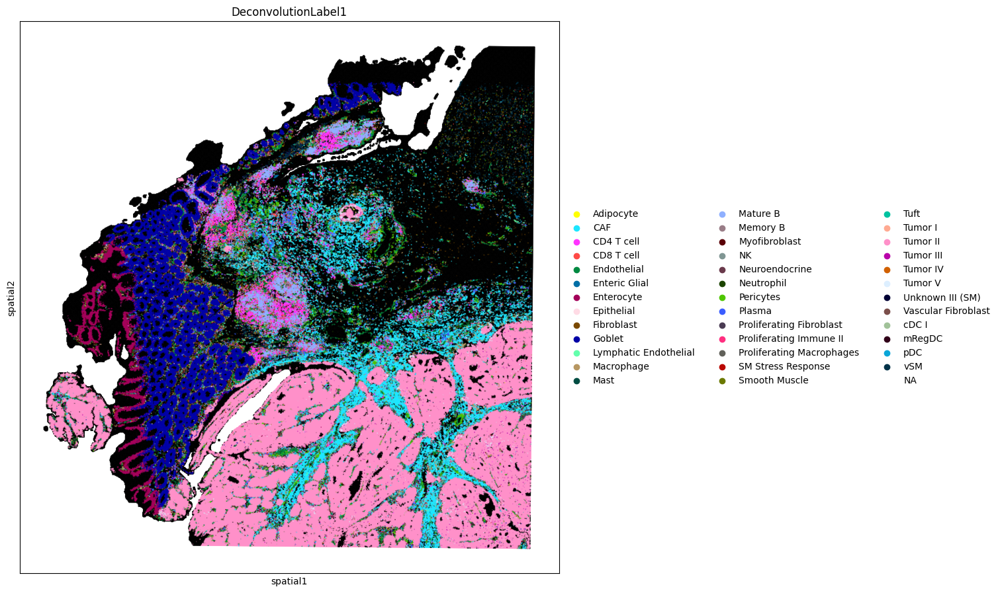

In [92]:
sq.pl.spatial_scatter(
    adata1,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


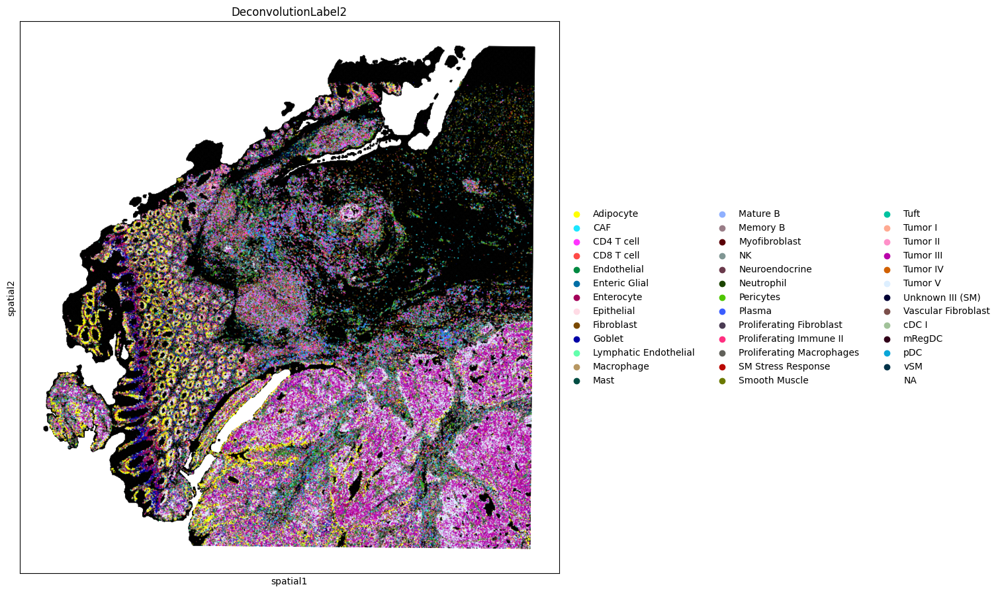

In [93]:
sq.pl.spatial_scatter(
    adata1,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


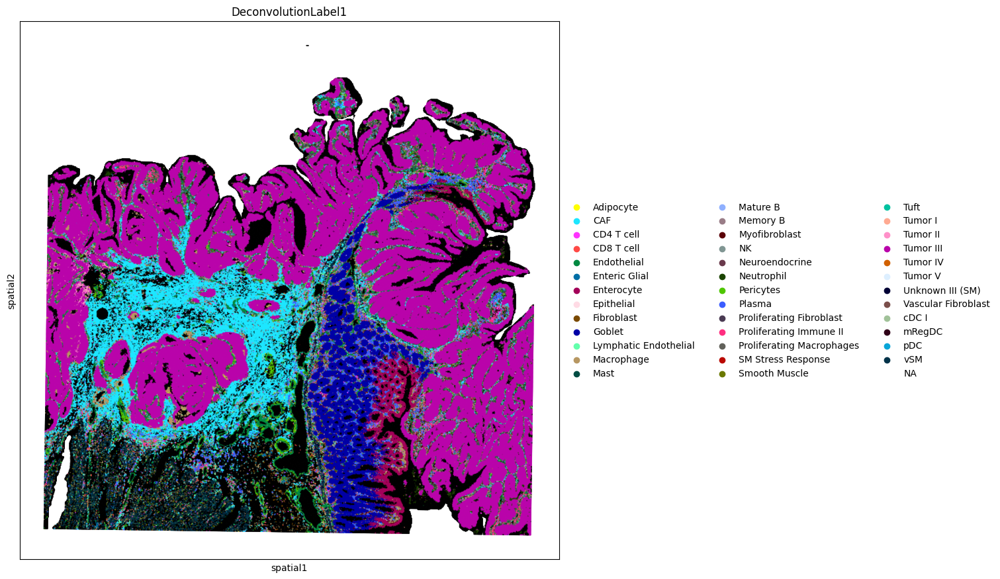

In [91]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


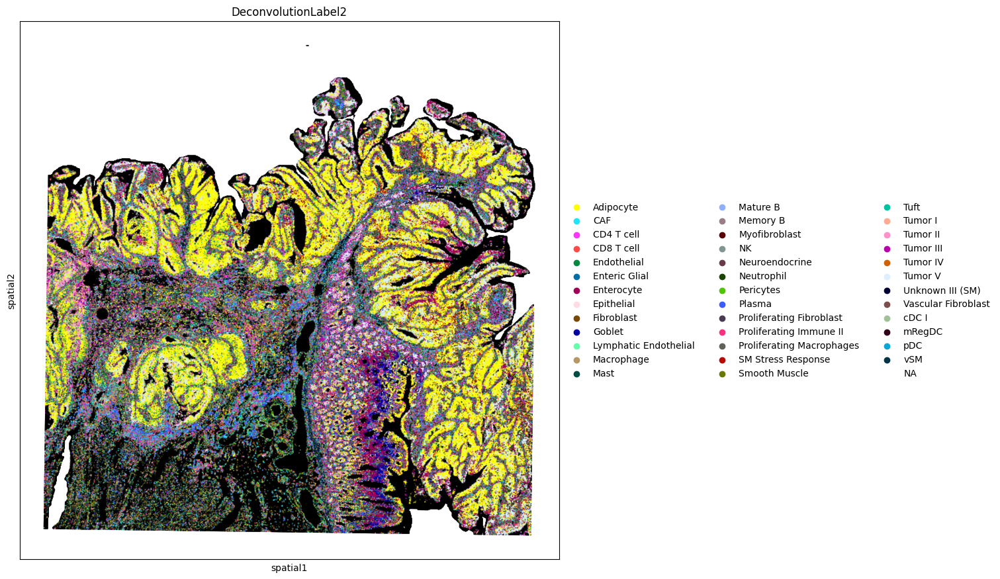

In [94]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


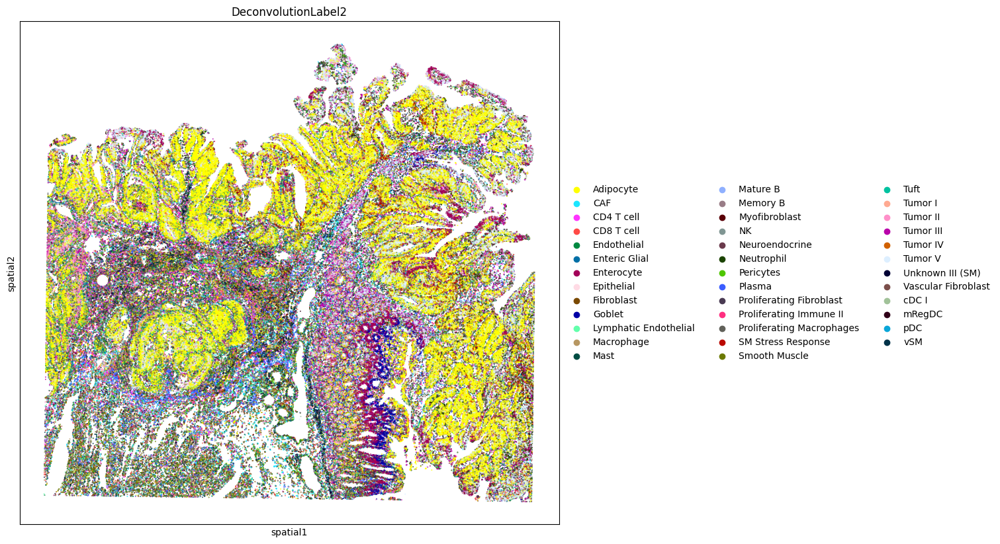

In [103]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


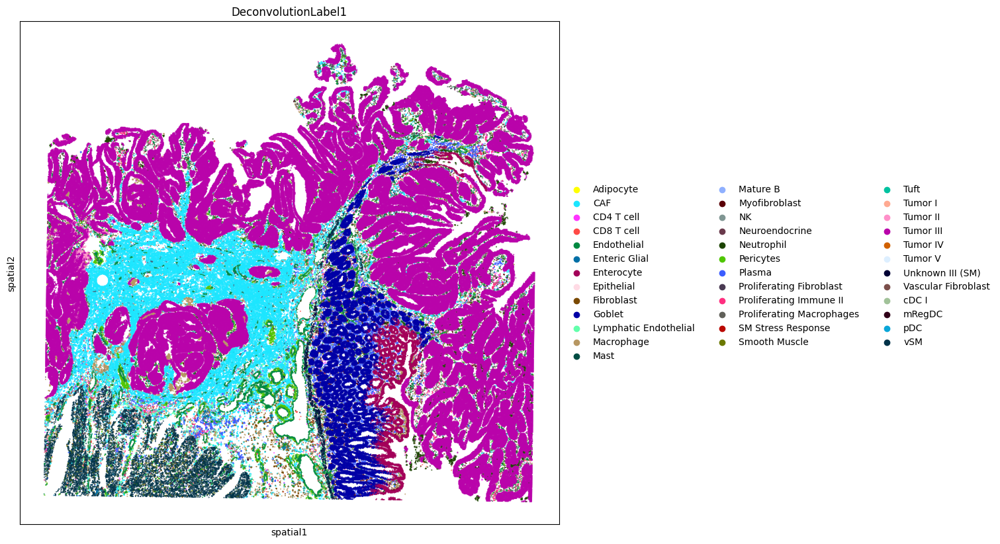

In [110]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


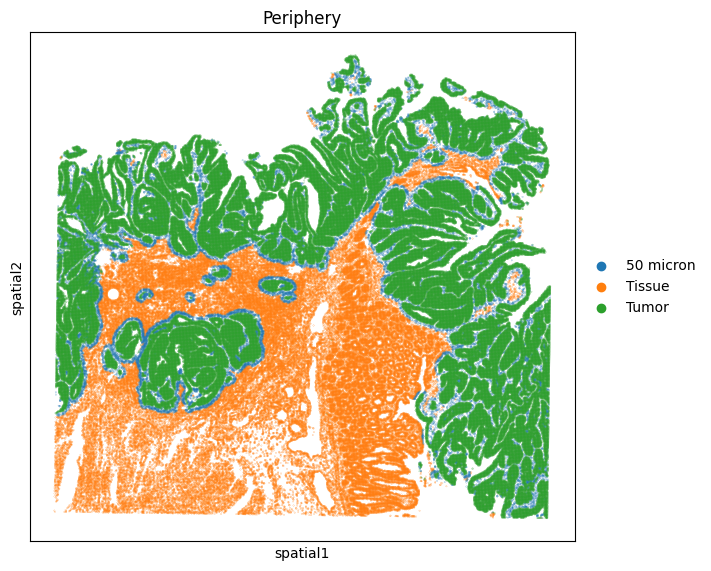

In [108]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "Periphery",
    ],
    wspace=0.4,
    size=0.02,
    figsize=(7, 7)
)

In [109]:
set(adata2_singlet.obs.Periphery)

{'50 micron', 'Tissue', 'Tumor'}

The tumor periphery is where tumor meets stroma; typically enriched for invasive fronts, angiogenesis, immune infiltration

In [111]:
adata2_singlet.obs.DeconvolutionLabel1.value_counts()

DeconvolutionLabel1
Tumor III                    198811
CAF                           40450
Goblet                        26625
vSM                           11676
Endothelial                    9070
Enterocyte                     8732
Macrophage                     4463
Plasma                         4246
Pericytes                      3208
Neutrophil                     2389
Proliferating Macrophages      1957
Proliferating Fibroblast       1664
Myofibroblast                  1611
Fibroblast                     1227
Lymphatic Endothelial          1078
Proliferating Immune II         995
Tumor II                        775
Smooth Muscle                   614
Unknown III (SM)                581
CD4 T cell                      536
CD8 T cell                      434
Enteric Glial                   423
Tumor V                         145
Neuroendocrine                  100
Tumor I                          88
cDC I                            77
Epithelial                       75
Mast    

## Prepare data for Mintflow

### Patient 1

In [114]:
if adata1_singlet.raw is not None:
    print("adata.raw exists")
else:
    print("adata.raw does not exist")


adata.raw does not exist


In [117]:
if "counts" in adata1_singlet.layers:
    print("Raw counts are stored in adata.layers['counts']")

In [118]:
if "counts" in adata1_singlet.layers:
    adata1_singlet.raw = anndata.AnnData(adata1_singlet.layers["counts"], var=adata1_singlet.var, obs=adata1_singlet.obs)
    print("Raw counts stored in adata.raw")
else:
    print("No 'counts' layer found in adata.layers")

No 'counts' layer found in adata.layers


In [120]:
adata1_singlet

AnnData object with n_obs × n_vars = 235530 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'DeconvolutionLabel1_colors', 'DeconvolutionLabel2_colors'
    obsm: 'spatial'

In [122]:
adata1_singlet.raw = adata1_singlet.copy()

In [123]:
adata1_singlet = adata1_singlet.raw.to_adata()

In [124]:
print(type(adata1_singlet.X))
print(adata1_singlet.X.dtype)

<class 'scipy.sparse._csr.csr_matrix'>
float32


In [127]:
adata1_singlet.X = np.round(adata1_singlet.X).astype(int)
print(adata1_singlet.X.dtype)

int64


In [128]:
adata1_singlet.obs["patient_id"] = "P1"

In [129]:
adata1_singlet.write_h5ad(sample_dir + "GSM8594567_P1/adata_sc_P1_rawformintflow.h5ad")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


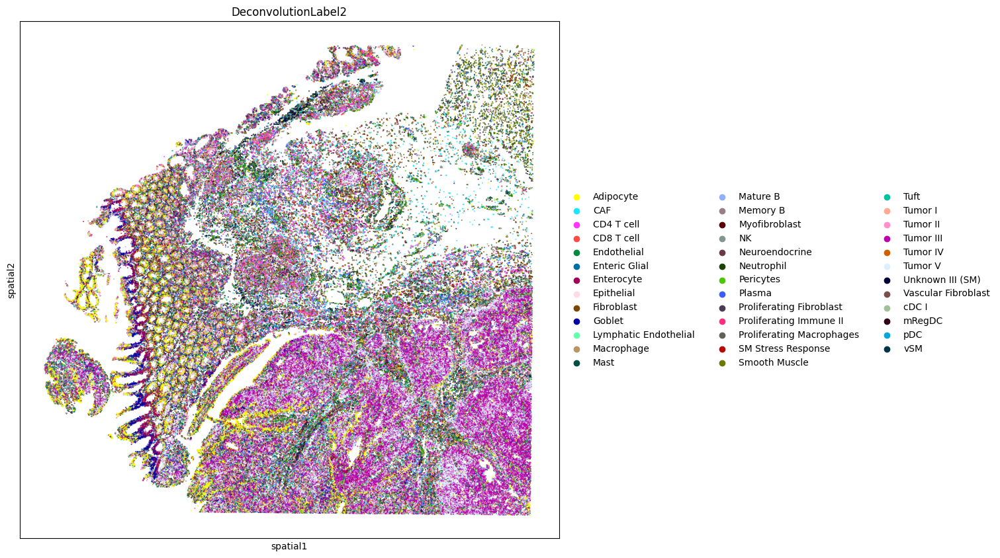

In [130]:
sq.pl.spatial_scatter(
    adata1_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


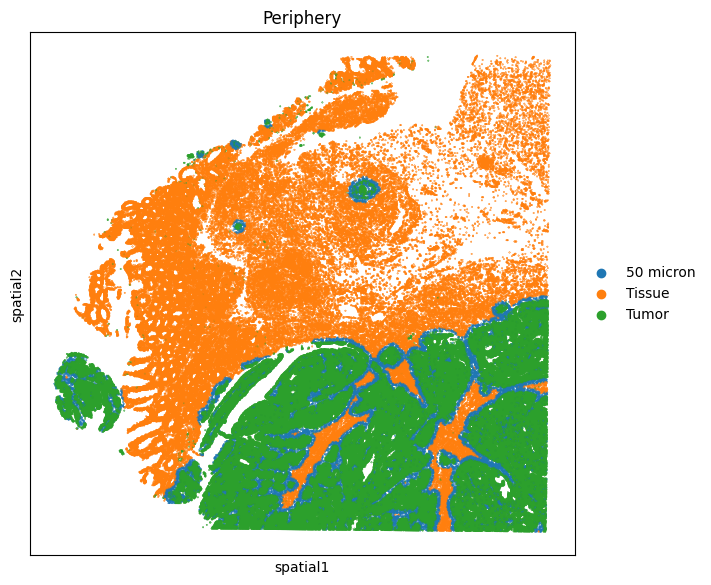

In [132]:
sq.pl.spatial_scatter(
    adata1_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "Periphery",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(7, 7)
)

### Patient 2

In [133]:
if adata2_singlet.raw is not None:
    print("adata.raw exists")
else:
    print("adata.raw does not exist")


adata.raw does not exist


In [134]:
if "counts" in adata2_singlet.layers:
    print("Raw counts are stored in adata.layers['counts']")

In [136]:
if "counts" in adata2_singlet.layers:
    adata2_singlet.raw = anndata.AnnData(adata2_singlet.layers["counts"], var=adata2_singlet.var, obs=adata2_singlet.obs)
    print("Raw counts stored in adata.raw")
else:
    print("No 'counts' layer found in adata.layers")

No 'counts' layer found in adata.layers


In [137]:
adata2_singlet

AnnData object with n_obs × n_vars = 322327 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'DeconvolutionLabel1_colors', 'DeconvolutionLabel2_colors', 'Periphery_colors'
    obsm: 'spatial'

In [138]:
adata2_singlet.raw = adata2_singlet.copy()

In [139]:
adata2_singlet = adata2_singlet.raw.to_adata()

In [140]:
print(type(adata2_singlet.X))
print(adata2_singlet.X.dtype)

<class 'scipy.sparse._csr.csr_matrix'>
float32


In [141]:
adata2_singlet.X = np.round(adata2_singlet.X).astype(int)
print(adata2_singlet.X.dtype)

int64


In [142]:
adata2_singlet.obs["patient_id"] = "P2"

In [143]:
adata2_singlet.write_h5ad(sample_dir + "GSM8594568_P2/adata_sc_P2_rawformintflow.h5ad")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


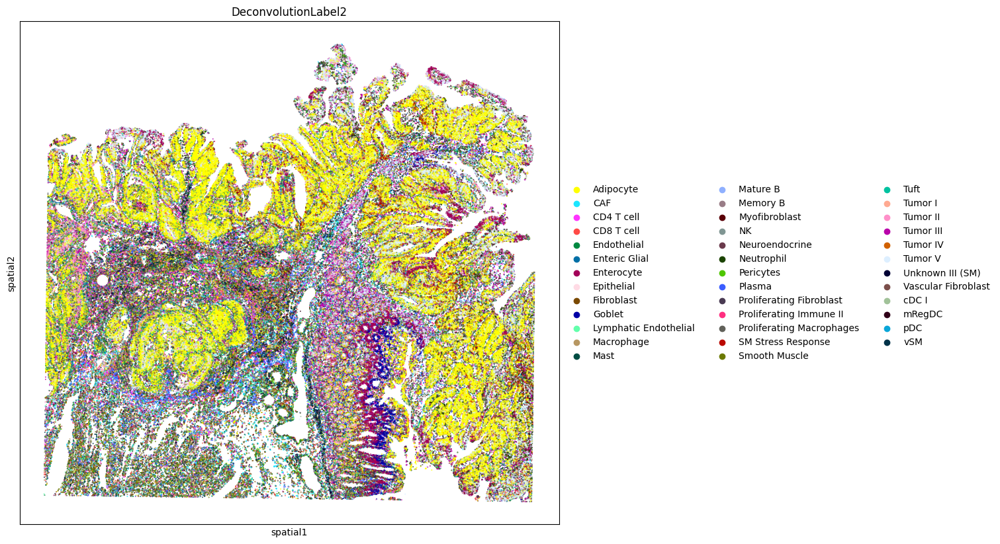

In [103]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


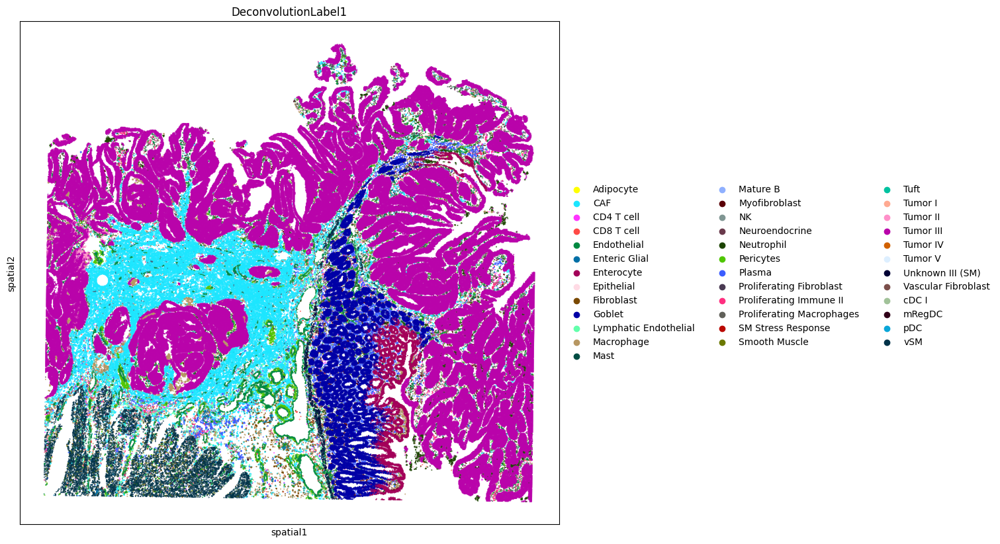

In [110]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


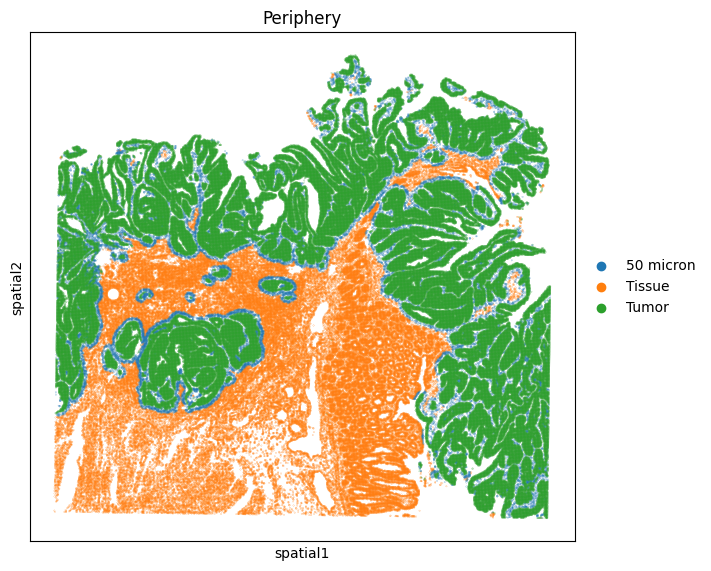

In [108]:
sq.pl.spatial_scatter(
    adata2_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "Periphery",
    ],
    wspace=0.4,
    size=0.02,
    figsize=(7, 7)
)

### Patient 5

In [145]:
if adata5_singlet.raw is not None:
    print("adata.raw exists")
else:
    print("adata.raw does not exist")


adata.raw does not exist


In [146]:
if "counts" in adata5_singlet.layers:
    print("Raw counts are stored in adata.layers['counts']")

In [147]:
if "counts" in adata5_singlet.layers:
    adata5_singlet.raw = anndata.AnnData(adata5_singlet.layers["counts"], var=adata5_singlet.var, obs=adata5_singlet.obs)
    print("Raw counts stored in adata.raw")
else:
    print("No 'counts' layer found in adata.layers")

No 'counts' layer found in adata.layers


In [148]:
adata5_singlet

AnnData object with n_obs × n_vars = 252242 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [149]:
adata5_singlet.raw = adata5_singlet.copy()

In [150]:
adata5_singlet = adata5_singlet.raw.to_adata()

In [151]:
print(type(adata5_singlet.X))
print(adata5_singlet.X.dtype)

<class 'scipy.sparse._csr.csr_matrix'>
float32


In [152]:
adata5_singlet.X = np.round(adata5_singlet.X).astype(int)
print(adata5_singlet.X.dtype)

int64


In [153]:
adata5_singlet.obs["patient_id"] = "P5"

In [154]:
adata5_singlet.write_h5ad(sample_dir + "GSM8594569_P5/adata_sc_P5_rawformintflow.h5ad")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


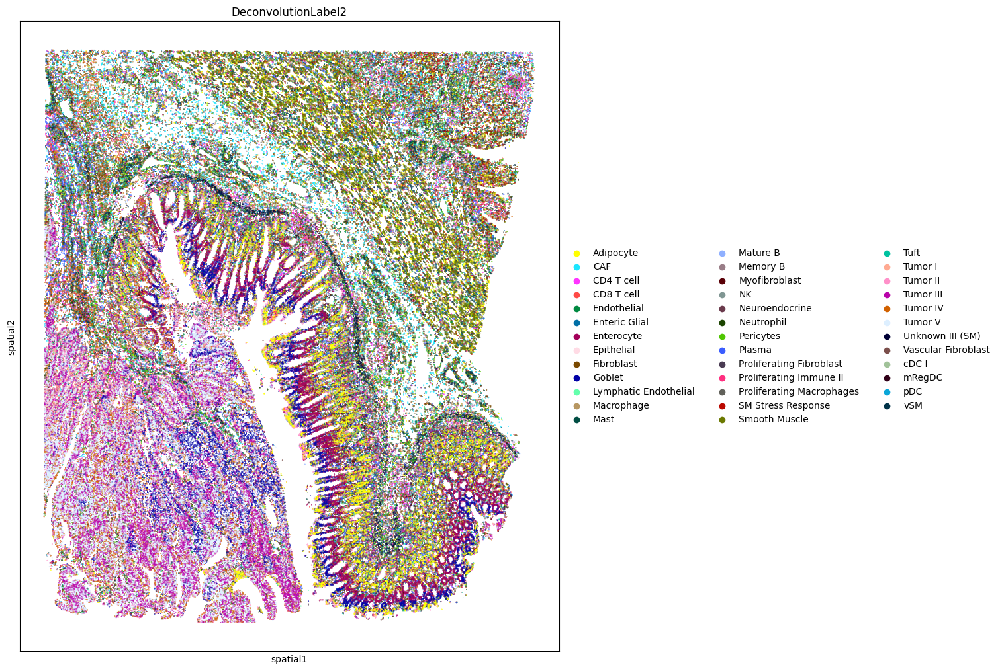

In [155]:
sq.pl.spatial_scatter(
    adata5_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


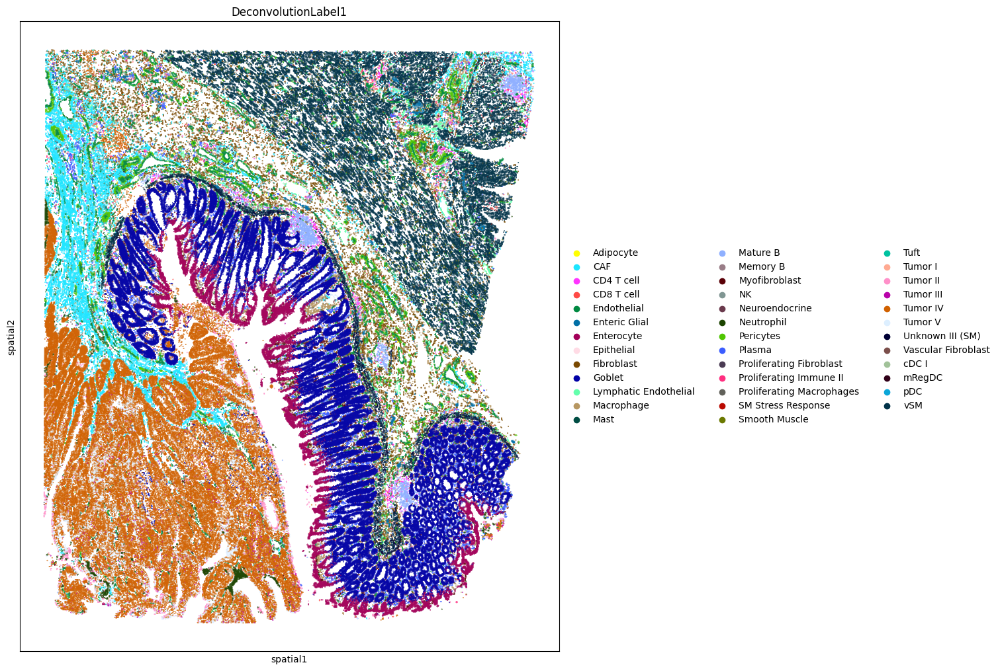

In [156]:
sq.pl.spatial_scatter(
    adata5_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


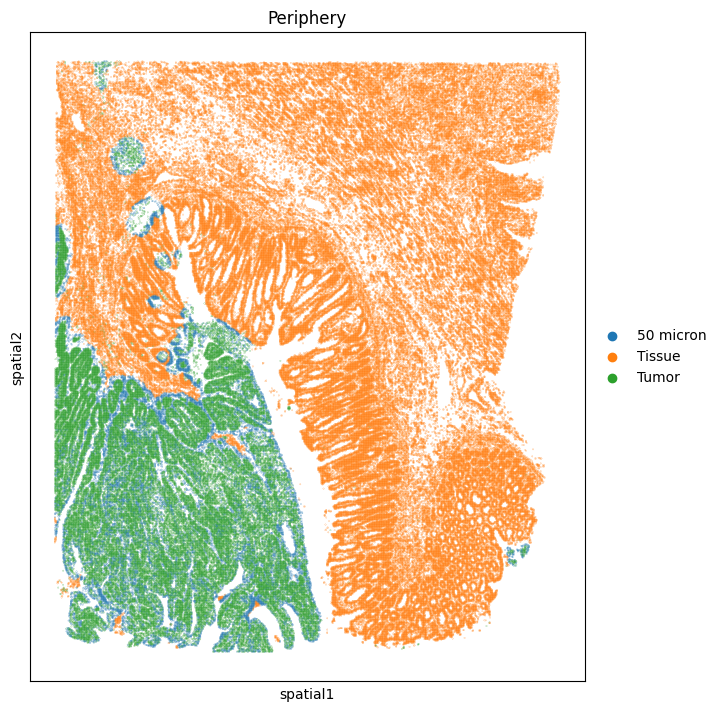

In [157]:
sq.pl.spatial_scatter(
    adata5_singlet,
    library_id="spatial",
    shape=None,
    color=[
        "Periphery",
    ],
    wspace=0.4,
    size=0.02,
    figsize=(7, 7)
)

## Notes

All the results of the analysis (the anndata files) have been moved to `/nfs/team361/ms83/data/CRC/visiumHD_mintflow/raw_data`